In [1]:
# импорт пакетов
import pandas as pd
import numpy as np
import seaborn as sns
import re
import random

import src
from src import cleanData as CD
from src import dataModifier as DM
from src import edaPlotDataAdapt as DA

from matplotlib.pyplot import figure
import matplotlib.pyplot as plt
import matplotlib.mlab as mlab
import matplotlib

import eda as EDA


In [2]:
#1 Быстро взглянем на данные
"""Прежде чем переходить к процессу очистки, посмотрим, что представляют из себя данные сейчас. 
Этот код покажет нам,  что набор данных состоит из 30471 строки и 292 столбцов.
 Мы увидим, являются ли эти столбцы числовыми или категориальными признаками.
"""

CD.initMatplotlib()

# чтение данных
df = pd.read_csv('data/DataSet/data.csv', delimiter=';')

# shape and data types of the data
print(df.shape)
print(df.dtypes)
# отбор числовых колонок
CD.printNumericCols(df)

# отбор нечисловых колонок
CD.printNonNumericCols(df)


(1041, 35)
company_id             int64
industry              object
naics_description     object
sic_description       object
categories            object
naics_code           float64
naics_codes           object
sic_code             float64
sic_codes             object
employees_range       object
employees            float64
revenue_range         object
revenue              float64
year_founded         float64
Category              object
V_Oct19              float64
V_Nov19              float64
V_Dec19              float64
V_Jan20              float64
V_Feb20              float64
V_Mar20              float64
S1_Jan20               int64
S1_Feb20               int64
S1_Mar20               int64
S2_Apr19               int64
S2_May19               int64
S2_Jun19               int64
S2_Jul19               int64
S2_Aug19               int64
S2_Sep19               int64
S2_Oct19               int64
S2_Nov19               int64
S2_Dec19               int64
S2_Jan20               int64
S2_

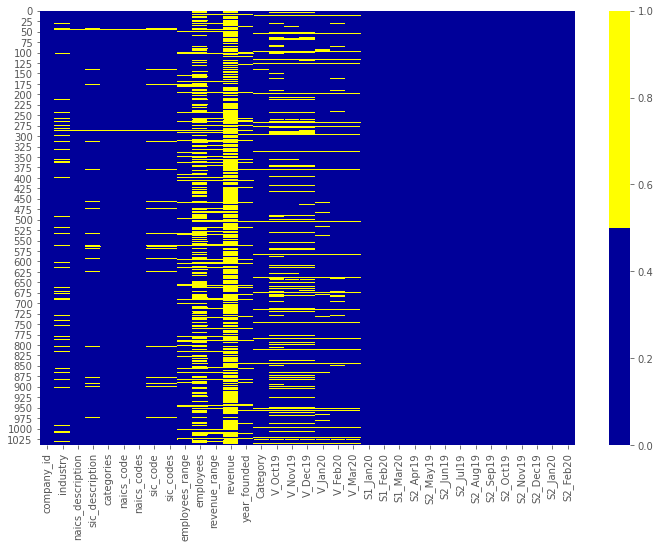

In [3]:
#2 Отсутствующие данные

# 2.1. Тепловая карта пропущенных значений
"""
В нашем наборе не очень много признаков, поэтому, визуализируем пропущенные значения с помощью тепловой карты.
"""

CD.HeatmapCreate(df)
plt.show()


In [4]:
# 2.2. Процентный список пропущенных данных
"""
Чтобы более формально оценить проблему отсутствующих данных составим список долей отсутствующих записей для каждого признака.
Этот список является полезным дополнением тепловой карты.
"""
CD.printPercentLostData(df)


company_id - 0.0%
industry - 9.0%
naics_description - 1.0%
sic_description - 5.0%
categories - 0.0%
naics_code - 1.0%
naics_codes - 1.0%
sic_code - 5.0%
sic_codes - 5.0%
employees_range - 10.0%
employees - 43.0%
revenue_range - 13.0%
revenue - 73.0%
year_founded - 9.0%
Category - 8.0%
V_Oct19 - 25.0%
V_Nov19 - 20.0%
V_Dec19 - 20.0%
V_Jan20 - 10.0%
V_Feb20 - 11.0%
V_Mar20 - 8.0%
S1_Jan20 - 0.0%
S1_Feb20 - 0.0%
S1_Mar20 - 0.0%
S2_Apr19 - 0.0%
S2_May19 - 0.0%
S2_Jun19 - 0.0%
S2_Jul19 - 0.0%
S2_Aug19 - 0.0%
S2_Sep19 - 0.0%
S2_Oct19 - 0.0%
S2_Nov19 - 0.0%
S2_Dec19 - 0.0%
S2_Jan20 - 0.0%
S2_Feb20 - 0.0%


In [5]:
#3 Восстановление пропущенных значений
#3.1. Отбрасывание записей
"""
Сперва отсеем те строки, которые содержать слишком много пропусков в данных. 
Нет смысла бороться за такие строки, если попытаться их восстановить они создадут либо дубликаты, либо шум.

Для отбрасывания можно ориентироваться на вычесленный ранее процент пропусков по столбцам, 
лишь небольшое количество строк содержат критическое значение пропусков. 
"""
df = CD.dropRow(df, 10)


created missing indicator for: industry
created missing indicator for: naics_description
created missing indicator for: sic_description
created missing indicator for: categories
created missing indicator for: naics_code
created missing indicator for: naics_codes
created missing indicator for: sic_code
created missing indicator for: sic_codes
created missing indicator for: employees_range
created missing indicator for: employees
created missing indicator for: revenue_range
created missing indicator for: revenue
created missing indicator for: year_founded
created missing indicator for: Category
created missing indicator for: V_Oct19
created missing indicator for: V_Nov19
created missing indicator for: V_Dec19
created missing indicator for: V_Jan20
created missing indicator for: V_Feb20
created missing indicator for: V_Mar20


In [6]:
#3.2. Внесение недостающих значений
#3.2.1. Замена медианой
"""
Воспользуемся заполнения пропусков медианами признака, для некоторых численных признаков, таких как: год основания кампании и показы кампании.
"""
df = CD.replacNaMedian(df, [
    'year_founded', 'V_Oct19', 'V_Nov19', 'V_Dec19', 'V_Jan20', 'V_Feb20',
    'V_Mar20'
])

df = CD.rangeAverage(df, 'employees_range', 'employees')
df = CD.rangeAverage(df, 'revenue_range', 'revenue')


In [7]:
#3.2.2. Замена с использованием сторонних данных
df = CD.fillSicUseNaics(df, 'data/DataSet/NAICS-to-SIC.csv')


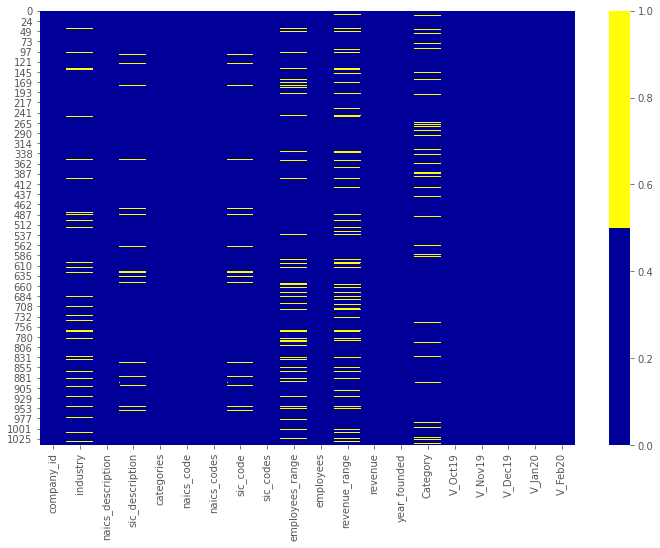

In [8]:
#Тепловая карта

CD.HeatmapCreate(df, 20)
plt.show()


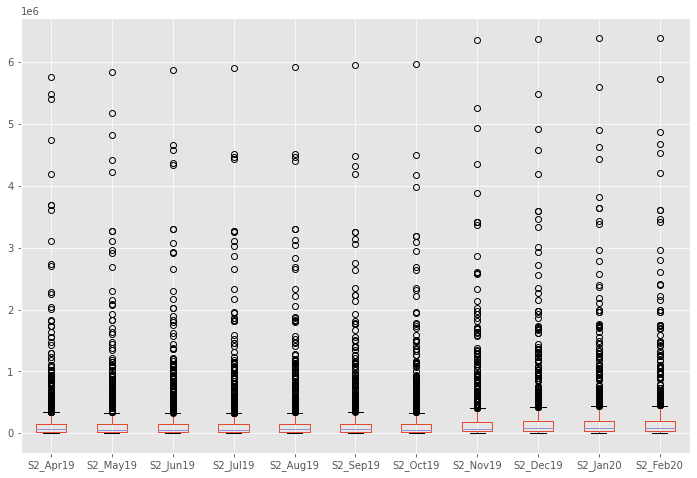

In [9]:
#4 Выбросы
"""
Немаловажным фактором являются выбросы в данных, такие ситуации обязательно нужно отслеживать
"""
column = [
    'S2_Apr19', 'S2_May19', 'S2_Jun19', 'S2_Jul19', 'S2_Aug19', 'S2_Sep19',
    'S2_Oct19', 'S2_Nov19', 'S2_Dec19', 'S2_Jan20', 'S2_Feb20'
]

df.boxplot(column)
plt.show()


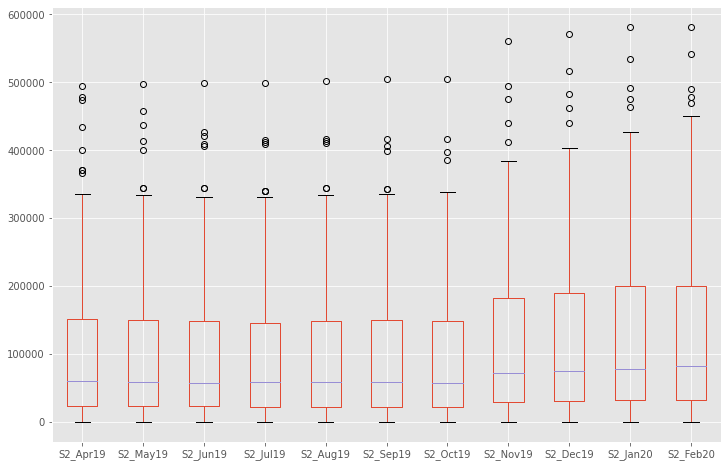

In [10]:
#4.1 Сглаживание выбросов

for col in column:
    kvantl = df[col].describe()
    kvantl = df[col].describe()['75%']
    for row_index, row in df[df[col] > df[col].describe()['75%']].iterrows():
        d10 = df.loc[row_index, col] * 0.06
        df.loc[row_index, col] = int(int(kvantl) + d10)

df.boxplot(column)
plt.show()


In [11]:
#5. подготовка тестовых данных для проверки работы сети
testData, df = CD.getTestingData(df, 6)


In [12]:
#6. Сохраним очищенные данные
df.to_csv('data/DataSet/CleanData.csv', index=False, sep=";")
testData.to_csv('data/DataSet/TestData.csv', index=False, sep=";")


In [13]:
#7. Распределение бюджетов кампаний по naics и sic отраслям
#   импорт данных из очищенного датасета
adspends_s1 = np.genfromtxt("data/DataSet/CleanData.csv",
                            dtype='float64',
                            delimiter=";",
                            skip_header=1,
                            usecols=(range(24, 35)))
naics = np.genfromtxt("data/DataSet/CleanData.csv",
                      dtype='float64',
                      delimiter=";",
                      skip_header=1,
                      usecols=(5))
sic = np.genfromtxt("data/DataSet/CleanData.csv",
                    dtype='float64',
                    delimiter=";",
                    skip_header=1,
                    usecols=(7))

naics = np.asarray(naics).astype('int')
sic = np.asarray(sic).astype('int')
# вычислим суммарные траты кампании
Summs = np.asarray(DA.summByColumn(adspends_s1)).astype('int')
# сгруппируем траты по категориям naics и sic кампаний
X1 = DA.groupByColumn(np.column_stack((naics, Summs)))
X2 = DA.groupByColumn(np.column_stack((sic, Summs)))


No handles with labels found to put in legend.


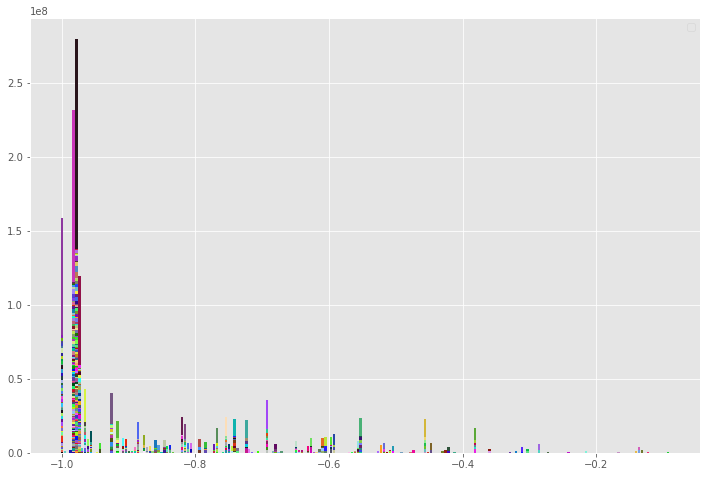

In [14]:
#7.1 Распределение бюджетов кампаний по naics
w1 = []
for q in X1:
    w1.append(np.asarray(X1[q]).astype('int'))
w1 = np.asarray(w1)
EDA.groupedBar(w1)
plt.show()


No handles with labels found to put in legend.


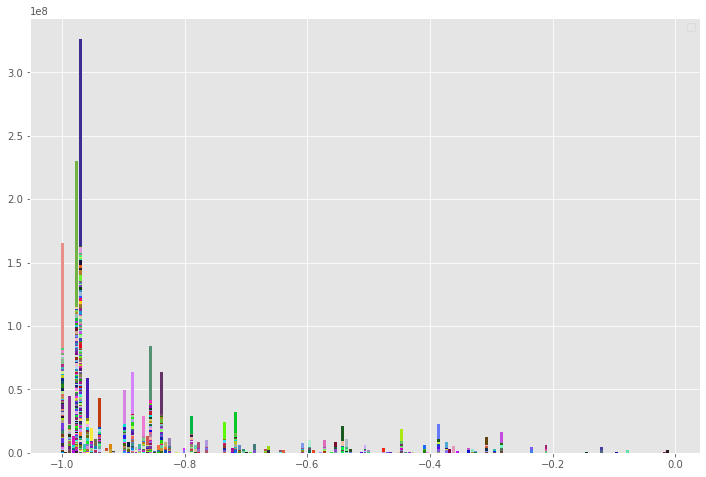

In [15]:
#7.2 Распределение бюджетов кампаний по sic
w2 = []
for q in X2:
    w2.append(np.asarray(X2[q]).astype('int'))
w2 = np.asarray(w2)
EDA.groupedBar(w2)
plt.show()


In [16]:
#8 Модель регрессии на Dense-слоях
#8.1 Импорт данных
adspends_s1 = np.genfromtxt("data/DataSet/CleanData.csv",
                            dtype='int',
                            delimiter=";",
                            skip_header=1,
                            usecols=(range(24, 35)))

fiches = np.genfromtxt("data/DataSet/CleanData.csv",
                       delimiter=";",
                       skip_header=1,
                       usecols=(5, 10, 12, 13, 15, 16, 17, 18, 19, 20))

SIC_codes = np.genfromtxt("data/DataSet/CleanData.csv",
                          dtype='str',
                          delimiter=";",
                          skip_header=1,
                          usecols=(8))

sucsSIC_codes = np.genfromtxt("data/DataSet/sucsSIC_codes.csv",
                              dtype='str',
                              delimiter=";",
                              skip_header=1)


In [17]:
#8.2 Обработка и нормализация данных

#доп. стоблец баллы для компаний с разрешёнными в sic-кодами
ballSic = DM.covid19SicCode(SIC_codes, sucsSIC_codes)

X = np.column_stack((fiches, ballSic, adspends_s1[:, :-3]))
Y = adspends_s1[:, -3:]

X = np.asarray(X).astype('float32')
Y = np.asarray(Y).astype('int')

X, mean, std = DM.normalization(X)

# перемешивание данных
indices = DM.mixedIndex(X)
X = X[indices]
Y = Y[indices]


In [18]:
#8.3 Инициализация модели

from keras import models
from keras import layers
from keras import regularizers

model = models.Sequential()
model.add(layers.Dense(32, activation='relu', input_shape=(X.shape[1], )))
model.add(layers.Dropout(0.15))
model.add(layers.Dense(16, activation='relu'))
model.add(layers.Dropout(0.05))
model.add(layers.Dense(Y.shape[1]))

model.compile(optimizer='adadelta', loss='mse', metrics=['mae'])


Using TensorFlow backend.


In [19]:
#8.4 Обучение модели
history = model.fit(X, Y, epochs=65, batch_size=32, validation_split=0.4)

#8.5 Итоговая точность
print(model.evaluate(X, Y))


Train on 610 samples, validate on 408 samples
Epoch 1/65
610/610 [==============================] - 0s 256us/step - loss: 19100494098.4656 - mae: 105884.2031 - val_loss: 20527450714.3529 - val_mae: 109448.1250
Epoch 2/65
610/610 [==============================] - 0s 57us/step - loss: 19100241268.6689 - mae: 105883.2891 - val_loss: 20526819809.8824 - val_mae: 109445.8594
Epoch 3/65
610/610 [==============================] - 0s 58us/step - loss: 19095584714.2820 - mae: 105868.4688 - val_loss: 20486770406.9020 - val_mae: 109332.8828
Epoch 4/65
610/610 [==============================] - 0s 58us/step - loss: 14983256328.3934 - mae: 92864.9922 - val_loss: 2049827744.6275 - val_mae: 36861.8398
Epoch 5/65
610/610 [==============================] - 0s 60us/step - loss: 2741561496.2098 - mae: 35441.8984 - val_loss: 1062581084.8627 - val_mae: 22518.0742
Epoch 6/65
610/610 [==============================] - 0s 64us/step - loss: 2464032245.0885 - mae: 30337.4023 - val_loss: 704601810.8235 - val_ma

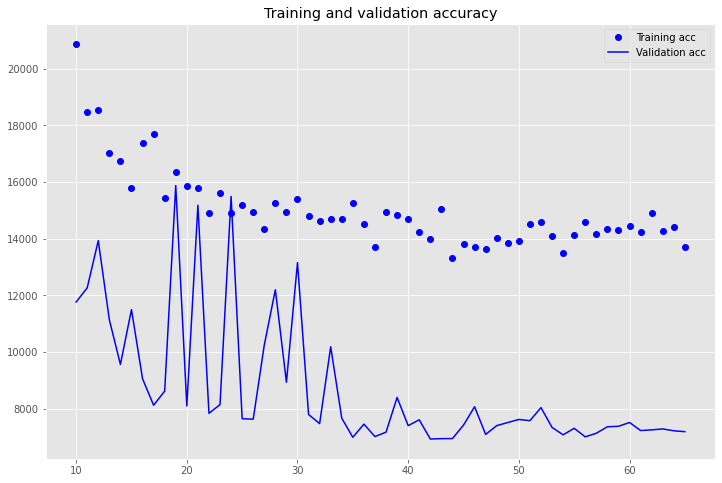

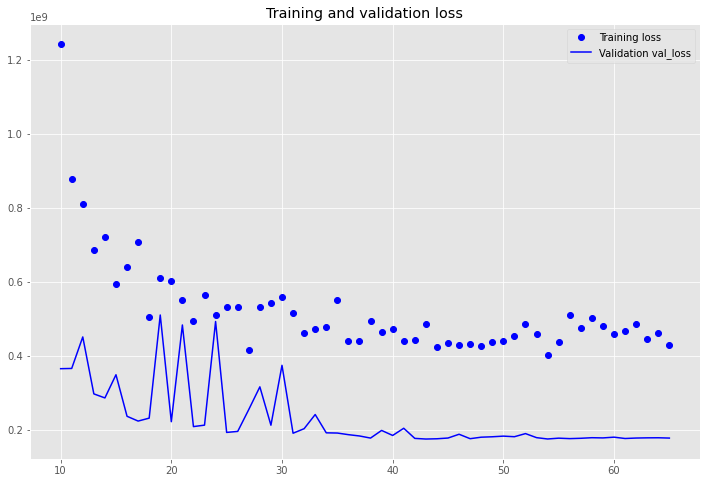

In [20]:
#8.6 графики изменения качества модели

import matplotlib.pyplot as plt

acc = history.history['mae']
val_acc = history.history['val_mae']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(10, len(acc) + 1)

plt.plot(epochs, acc[9:], 'bo', label='Training acc')
plt.plot(epochs, val_acc[9:], 'b', label='Validation acc')
plt.title('Training and validation accuracy')
plt.legend()

plt.figure()

plt.plot(epochs, loss[9:], 'bo', label='Training loss')
plt.plot(epochs, val_loss[9:], 'b', label='Validation val_loss')
plt.title('Training and validation loss')
plt.legend()

plt.show()


In [21]:
#8.7 Проверка модели на тестовых данных
#8.7.1 Импорт тестовых данных
adspends_s1 = np.genfromtxt("data/DataSet/TestData.csv",
                            dtype='int',
                            delimiter=";",
                            skip_header=1,
                            usecols=(range(24, 35)))

fiches = np.genfromtxt("data/DataSet/TestData.csv",
                       delimiter=";",
                       skip_header=1,
                       usecols=(5, 10, 12, 13, 15, 16, 17, 18, 19, 20))

SIC_codes = np.genfromtxt("data/DataSet/TestData.csv",
                          dtype='str',
                          delimiter=";",
                          skip_header=1,
                          usecols=(8))


In [22]:
#8.7.2 Обработка и нормализация данных
ballSic = DM.covid19SicCode(SIC_codes, sucsSIC_codes)

x_test = np.column_stack((fiches, ballSic, adspends_s1[:, :-3]))
y_test = adspends_s1[:, -3:]

x_test = np.asarray(x_test).astype('float32')
y_test = np.asarray(y_test).astype('int')

x_test = DM.normalization(x_test, mean, std)


In [23]:
#8.7.3 Predict
y_pred = np.array(model.predict(x_test))
y_pred = np.column_stack((adspends_s1[:, :-3], y_pred))


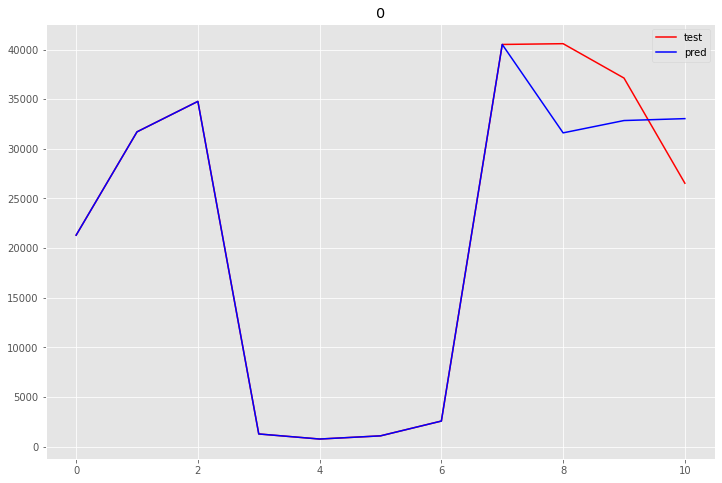

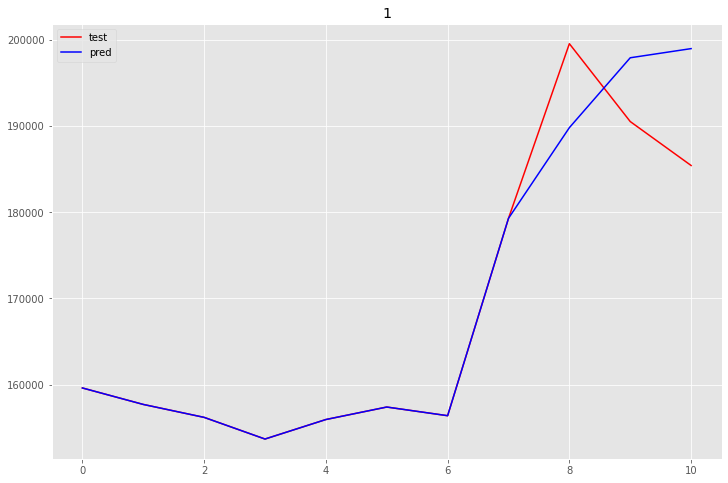

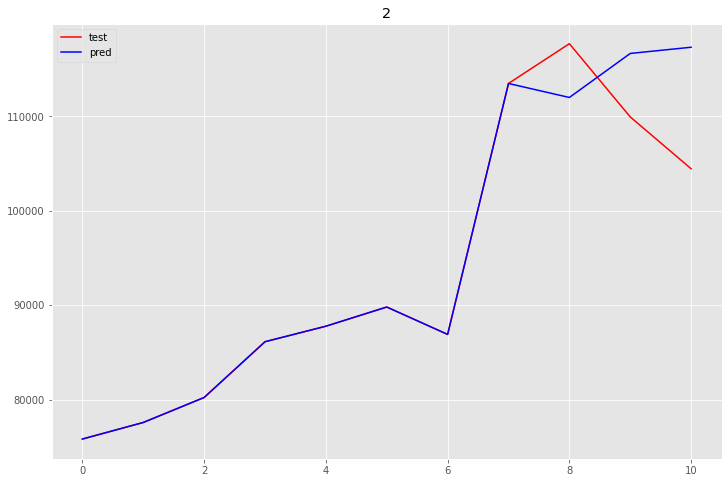

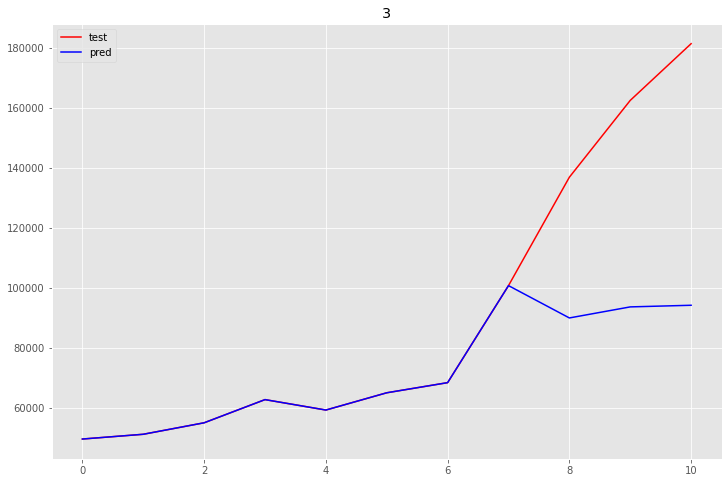

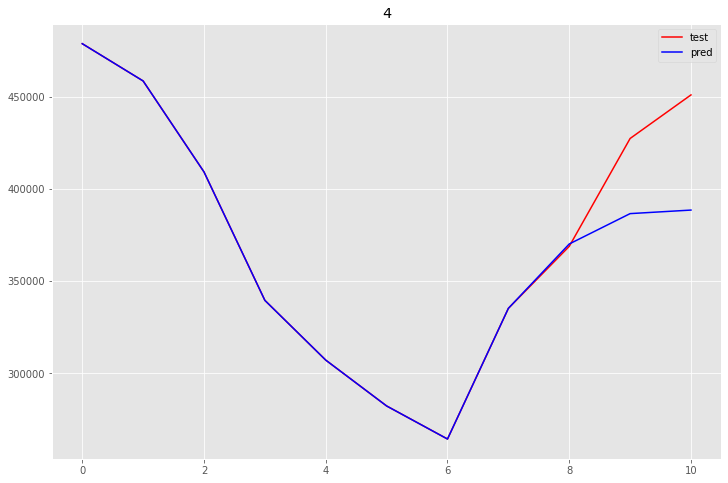

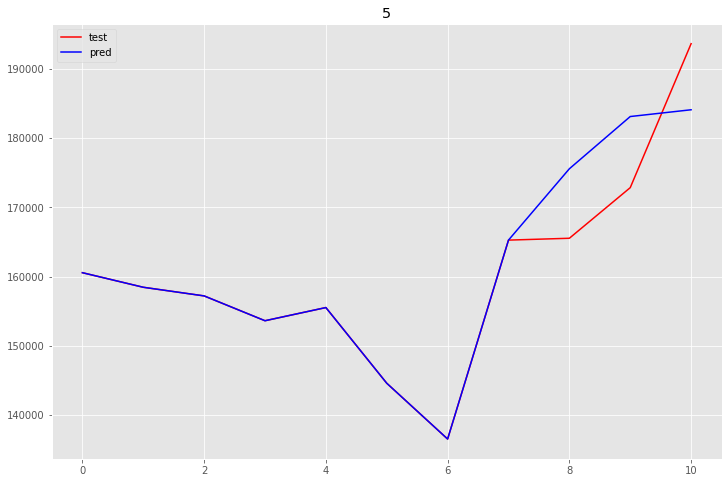

<Figure size 864x576 with 0 Axes>

In [24]:
#8.7.4 Визуализация данных
for i in range(len(y_test)):
    plt.plot(adspends_s1[i, :], 'b', color='r', label='test')
    plt.plot(y_pred[i, :], 'b', label='pred')
    plt.title(i)
    plt.legend()
    plt.show()
    plt.figure()